# Modelis. Treniravimas.

In [1]:

# %pip install pandas
import pandas as pd
import numpy as np
#pip install -U matplotlib
import matplotlib.pyplot as plt
# %pip install scikit-learn
from sklearn import metrics
from datetime import datetime
import os

In [2]:
data_path = "C:\\Users\\jolged\\PycharmProjects\\2022-11_Data_science_Code_Academy\\Final_Project\\AutoAptikimas\\"
version = 'v2.2.0'
ts = int(datetime.now().timestamp())
model_name = f'model_{version}_{ts}.hdf5'
run_name = f'run_{ts}'

train_dataset_path = data_path + f'data\\{version}\\train'
val_dataset_path = data_path + f'data\\{version}\\validation'
test_dataset_path = data_path + f'data\\{version}\\test'
path_to_save_model = data_path + 'model'
os.makedirs(path_to_save_model, exist_ok=True)
path_for_outputs = data_path + f'\\data\\{version}\\outputs\\{run_name}\\'
os.makedirs(path_for_outputs, exist_ok=True)

In [3]:
# %pip install tensorflow

In [4]:
# %pip install tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.callbacks import TensorBoard
# from tensorflow.keras import metrics
# from tensorflow.keras.metrics import Precision

In [5]:
# !pip install wandb -qU
import wandb
from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint

wandb.login()

wandb: Currently logged in as: jolita-gedminaite1. Use `wandb login --relogin` to force relogin


True

In [6]:


wandb_configs = {
        # Duomenys
        "train_dataset_path": train_dataset_path,
        "test_dataset_path": test_dataset_path,
        "labels": "inferred",
        "label_mode": "binary",
#         "label_mode": "binary",
        "color_mode": "rgb",
        "batch_size": 35,
        "image_size": (224, 224),
        "shuffle": False,
        "seed": 42,
                "Modelis" : """
model = keras.Sequential([
#     layers.experimental.preprocessing.Rescaling(1./255, input_shape=tuple(config.image_size) + (3,)),
    layers.Conv2D(128, (3, 3), activation='relu', input_shape=tuple(config.image_size) + (3,)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3, 3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(32, (3, 3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dense(1, activation="sigmoid"),
])
        """,
    "model_name": model_name,
        

        "optimizer": "adam",
#     "optimizer": "sgd",
        "loss":"binary_crossentropy",
    
        "metrics":["accuracy", 
                    'Precision',
                    "Recall",
                    'AUC',
                    "FalseNegatives",
                    "FalsePositives",
                    "TrueNegatives",
                    "TruePositives"
                  ],
        "epoch": 10,
}
    

In [7]:
# Parametrai


wandb.init(
    project="Auto_Recognition",   
    entity="jolita-gedminaite1", #Optional
    name=run_name,
    sync_tensorboard=True, # to sync the event files for a hosted TensorBoard environment
    config=wandb_configs,
)

config = wandb.config



# Treniravimo duomenys
train_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1. / 255)

train_data = train_datagen.flow_from_directory(
    config.train_dataset_path,
    target_size=config.image_size,
    batch_size=config.batch_size,
    class_mode=config.label_mode)

# train_data = keras.preprocessing.image_dataset_from_directory(
#     config.train_dataset_path,
#     labels=config.labels,
#     label_mode=config.label_mode,
#     color_mode=config.color_mode,
#     batch_size=config.batch_size,
#     image_size=config.image_size,
#     shuffle=config.shuffle
# )

# Testavimo duomenys
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1. / 255)
test_data = test_datagen.flow_from_directory(
    config.test_dataset_path,
    target_size=config.image_size,
    batch_size=config.batch_size,
    class_mode=config.label_mode,
    shuffle=config.shuffle)

# test_data = keras.preprocessing.image_dataset_from_directory(
#     config.test_dataset_path,
#     labels=config.labels,
#     label_mode=config.label_mode,
#     color_mode=config.color_mode,
#     batch_size=config.batch_size,
#     image_size=config.image_size,
#     shuffle=config.shuffle
# )
# 
# Modelio aprašymas
model = keras.Sequential([
    layers.Conv2D(128, (3, 3), activation='relu', input_shape=tuple(config.image_size) + (3,)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3, 3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(32, (3, 3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dense(1, activation="sigmoid"),
])

checkpoint = keras.callbacks.ModelCheckpoint(filepath=os.path.join(path_to_save_model, 
                                                                   model_name), 
#                                                                     monitor='val_loss',
                                                                    save_best_only=True, mode=min)

# # Kompiliavimas
# model.compile(
#     optimizer=config.optimizer,
#     loss=config.loss,
#     metrics=config.metrics,
# )

# Compile the model
model.compile(loss=config.loss,
              optimizer=tf.keras.optimizers.Adam(lr=1e-4),
              metrics=config.metrics)

# Treniravimas
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=config.epoch,
    callbacks=[checkpoint, WandbMetricsLogger(),TensorBoard(log_dir=wandb.run.dir)]
#     callbacks=[WandbMetricsLogger()]
#     callbacks = [checkpoint]
)



Found 701 images belonging to 2 classes.
Found 156 images belonging to 2 classes.


Epoch 1/10
21/21 [==============================] - ETA: 0s - loss: 0.7079 - accuracy: 0.6819 - precision: 0.6875 - recall: 0.7714 - auc: 0.6734 - false_negatives: 88.0000 - false_positives: 135.0000 - true_negatives: 181.0000 - true_positives: 297.0000 

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`


21/21 [==============================] - 394s 19s/step - loss: 0.7079 - accuracy: 0.6819 - precision: 0.6875 - recall: 0.7714 - auc: 0.6734 - false_negatives: 88.0000 - false_positives: 135.0000 - true_negatives: 181.0000 - true_positives: 297.0000 - val_loss: 0.5340 - val_accuracy: 0.7564 - val_precision: 0.7075 - val_recall: 0.9146 - val_auc: 0.7989 - val_false_negatives: 7.0000 - val_false_positives: 31.0000 - val_true_negatives: 43.0000 - val_true_positives: 75.0000
Epoch 2/10
21/21 [==============================] - 415s 20s/step - loss: 0.5329 - accuracy: 0.7561 - precision: 0.7316 - recall: 0.8779 - auc: 0.8037 - false_negatives: 47.0000 - false_positives: 124.0000 - true_negatives: 192.0000 - true_positives: 338.0000 - val_loss: 0.5774 - val_accuracy: 0.7500 - val_precision: 0.7048 - val_recall: 0.9024 - val_auc: 0.8205 - val_false_negatives: 8.0000 - val_false_positives: 31.0000 - val_true_negatives: 43.0000 - val_true_positives: 74.0000
Epoch 3/10
21/21 [=====================

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 128)     147584    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 128)    0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 110, 110, 128)     0         
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 64)      73792     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                    

In [28]:

os.makedirs(path_for_outputs + '\\Tensorboard', exist_ok=True)
# with open(path_for_outputs + 'Tensorboard\\tensorboard.txt', 'wb') as file:
#     file.write(pd.DataFrame(history.history))
    
pd.DataFrame(history.history).to_excel(path_for_outputs + 'Tensorboard\\tensorboard.xlsx')

In [29]:
pd.read_excel(path_for_outputs + 'Tensorboard\\tensorboard.xlsx')

,Unnamed: 0,loss,accuracy,precision,recall,auc,false_negatives,false_positives,true_negatives,true_positives,val_loss,val_accuracy,val_precision,val_recall,val_auc,val_false_negatives,val_false_positives,val_true_negatives,val_true_positives
0,0,0.707900,0.681883,0.687500,0.771429,0.673414,88,135,181,297,0.533961,0.756410,0.707547,0.914634,0.798863,7,31,43,75
1,1,0.532918,0.756063,0.731602,0.877922,0.803682,47,124,192,338,0.577352,0.750000,0.704762,0.902439,0.820534,8,31,43,74
2,2,0.515078,0.757489,0.773537,0.789610,0.830228,81,89,227,304,0.536592,0.717949,0.806452,0.609756,0.820122,32,12,62,50
3,3,0.499159,0.764622,0.833333,0.714286,0.845401,110,55,261,275,0.515715,0.717949,0.702128,0.804878,0.820369,16,28,46,66
4,4,0.486708,0.777461,0.774580,0.838961,0.850785,62,94,222,323,0.507556,0.717949,0.711111,0.780488,0.827208,18,26,48,64
5,5,0.475691,0.791726,0.827397,0.784416,0.859025,83,63,253,302,0.502083,0.730769,0.704082,0.841463,0.828691,13,29,45,69
6,6,0.466125,0.807418,0.781532,0.901299,0.865210,38,97,219,347,0.498669,0.743590,0.710000,0.865854,0.842617,11,29,45,71
7,7,0.456512,0.820257,0.816626,0.867532,0.870335,51,75,241,334,0.479419,0.750000,0.712871,0.878049,0.865524,10,29,45,72
8,8,0.418350,0.840228,0.852713,0.857143,0.893416,55,57,259,330,0.465671,0.801282,0.774194,0.878049,0.879862,10,21,53,72
9,9,0.378248,0.844508,0.872973,0.838961,0.906921,62,47,269,323,0.430870,0.782051,0.961538,0.609756,0.917106,32,2,72,50


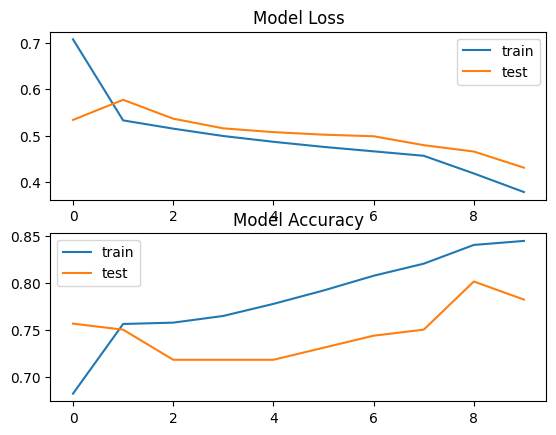

In [9]:
# plot loss during training
plt.subplot(211)
plt.title('Model Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
# plot accuracy during training
plt.subplot(212)
plt.title('Model Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.savefig(path_for_outputs + 'Loss_and_Accuracy.png')
plt.show()

model_v2.2.0_1684076806.hdf5
5/5 [==============================] - 19s 4s/step


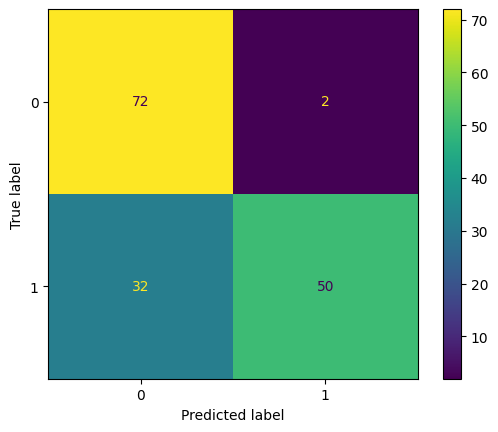

In [10]:
print(model_name)
model = keras.models.load_model(os.path.join(path_to_save_model, model_name))
predictions = model.predict(test_data, verbose=1)


predicted_classes = [1 if pred > 0.5 else 0 for pred in predictions]

# labels_test = []
# for batch, labels in test_data:
#     labels_test += labels.numpy().tolist()
# labels_test = list(np.array(labels_test).reshape(1,-1)[0])
# labels_test = [int(x) for x in labels_test]
labels_test = test_data.classes

report = metrics.classification_report(labels_test, predicted_classes, output_dict=True)
report = pd.DataFrame.from_dict(report).T
cm = metrics.confusion_matrix(labels_test, predicted_classes)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_data.class_indices)
cm_display.plot()

plt.savefig(path_for_outputs + 'Confusion_matrix.png')

plt.show()

In [11]:
report

,precision,recall,f1-score,support
0,0.692308,0.972973,0.808989,74.000000
1,0.961538,0.609756,0.746269,82.000000
accuracy,0.782051,0.782051,0.782051,0.782051
macro avg,0.826923,0.791365,0.777629,156.000000
weighted avg,0.833826,0.782051,0.776021,156.000000


In [12]:
# wandb.log({"confusion_matrix_1": cm, "report": report})
wandb.log({"report": report})

# wandb.log({"confusion_matrix_2" : wandb.plot.confusion_matrix(y_true=labels_test, preds=predicted_classes,
#                                 class_names=test_data.class_names)})

wandb.sklearn.plot_confusion_matrix(labels_test, predicted_classes, list(test_data.class_indices.values()))
# wandb.log({'roc': wandb.plots.ROC(labels_test, predicted_classes, test_data.class_names)})

    
# wandb.log({"conf_mat": cm})


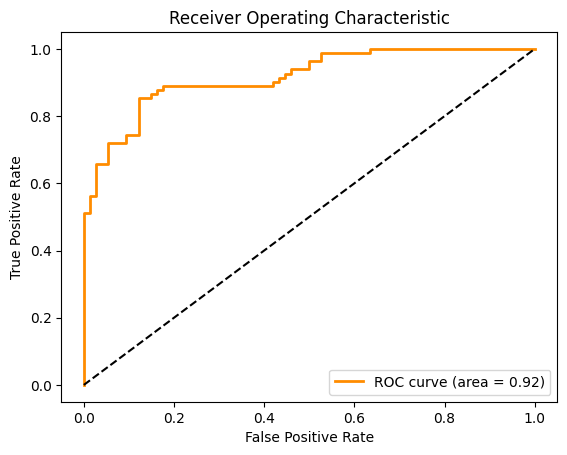

In [13]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get the predicted probabilities and true labels
y_prob = predictions
y_true = labels_test

# Extract the probabilities for the positive class
# y_score = y_prob[:, 1]
y_score = y_prob

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_true, y_score)
roc_auc = auc(fpr, tpr)

# # Plot ROC curve
# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(1,1,1)
# ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
# ax.plot([0, 1], [0, 1], 'k--')
# # ax.xlim([0.0, 1.0])
# # ax.ylim([0.0, 1.05])
# ax.xlabel('False Positive Rate')
# ax.ylabel('True Positive Rate')
# ax.title('Receiver Operating Characteristic')
# ax.legend(loc="lower right")
# plt.show()

# Plot the ROC curve
fig, ax = plt.subplots()
ax.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")

plt.savefig(path_for_outputs + 'ROC.png')
plt.show()

# Log the ROC curve to WandB

wandb.log({"ROC Curve": wandb.Image(fig)})
# wandb.log({ 'ROC Curve' : fig }) 

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

# Load a sample image and its corresponding true label
# image = plt.imread('image.jpg')
# true_label = plt.imread('true_label.jpg')

# Predict the label of the image using the CNN model
# model.predict(image)

# Threshold the predicted label to convert it into a binary mask
# predicted_label = np.round(model.predict(image)).astype(int)
# predicted_label = np.squeeze(predicted_label, axis=-1)

# Calculate the IOU score
iou_score = iou(labels_test, predicted_classes)
print('IOU: {:.2f}'.format(iou_score))

IOU: 0.60


In [15]:
def plot_results(images, actual_labels, predicted_labels):
        
    nrows = len(images)
    ncols = 5
    fig = plt.figure( figsize=(10, nrows*2))
    for i, (image, actual, predicted) in enumerate(zip(images, actual_labels, predicted_labels)):
        # Display the image
        ax = fig.add_subplot(nrows,ncols,i+1)
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        color = 'green'
        if actual != predicted:
            color = 'red'
        ax.set_title(f'Actual: {actual}\nPredicted: {predicted}', color= color)
        
    fig.savefig(path_for_outputs + 'Predictions.png', bbox_inches='tight')

    plt.tight_layout()
    plt.show()
#     wandb.log({ 'Predictions' : fig })

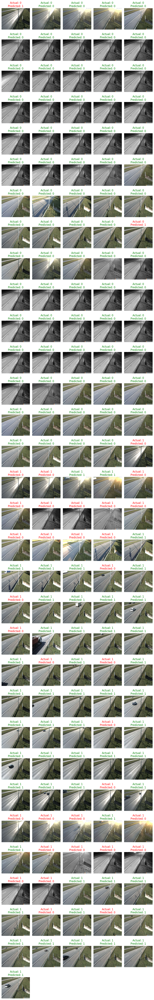

In [16]:
# Load the test images

images = []
for path in test_data.filepaths:
    img = plt.imread(path)
    images.append(img)
    
images_fail = []
actual_labels_fail = []
predicted_labels_fail = []
for image, actual, predicted in zip(images, labels_test, predicted_classes):
    images_fail.append(image)
    actual_labels_fail.append(actual)
    predicted_labels_fail.append(predicted)
    
# Display the results
plot_results(images_fail, actual_labels_fail, predicted_labels_fail)

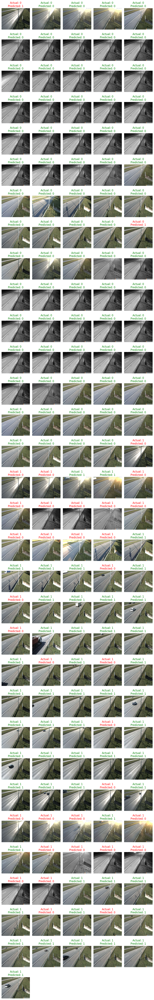

In [17]:
def plot_fails(images, actual_labels, predicted_labels):
    nrows = len(images)
    ncols = 5
    fig = plt.figure( figsize=(10, nrows*2))

    for i, (image, actual, predicted) in enumerate(zip(images, actual_labels, predicted_labels)):
        # Display the image
        ax = fig.add_subplot(nrows,ncols,i+1)
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        color = 'green'
        if actual != predicted:
            color = 'red'
        ax.set_title(f'Actual: {actual}\nPredicted: {predicted}', color= color)
        
    plt.savefig(path_for_outputs + 'Predictions.png')

    plt.tight_layout()
    plt.show()
    wandb.log({ 'Predictions' : fig })

# Load the test images

images = []
for path in test_data.filepaths:
    img = plt.imread(path)
    images.append(img)

# Display the results
plot_results(images, labels_test, predicted_classes)

In [18]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

# Load an individual image
# img_path = test_dataset_path + '\\1\\364_2023-04-25_070624_183908987.jpg'
# img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
# img_array = tf.keras.preprocessing.image.img_to_array(img)
# img_array = np.expand_dims(img_array, axis=0)

    
# def visualize_feature_maps(model, img_array, layer_name):
#     # Define a new Model that outputs the layer_name activations for the given input
#     intermediate_model = Model(inputs=model.input,
#                                outputs=model.get_layer(layer_name).output)
    
#     # Reshape the input image for use with the model
#     img_array = np.expand_dims(img_array, axis=0)
    
#     # Get the intermediate activations for the input image
#     intermediate_output = intermediate_model.predict(img_array)
    
#     # Plot the feature maps
#     num_feature_maps = intermediate_output.shape[3]
#     num_cols = 8
#     num_rows = int(np.ceil(num_feature_maps / num_cols))
#     plt.figure(figsize=(16, 16))
#     for i in range(num_feature_maps):
#         plt.subplot(num_rows, num_cols, i+1)
#         plt.imshow(intermediate_output[0, :, :, i], cmap='gray')
#         plt.axis('off')
    
#     plt.show()


# Visualize the feature maps of a specific convolutional layer
# layer_name = 'block3_conv1'
# visualize_feature_maps(model, img_array, layer_name)


# model.summary()

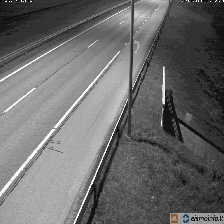

1/1 [==============================] - 0s 198ms/step


C:\Users\jolged\AppData\Local\Temp\ipykernel_22248\553532186.py:42: RuntimeWarning: invalid value encountered in divide
  x /= x.std ()


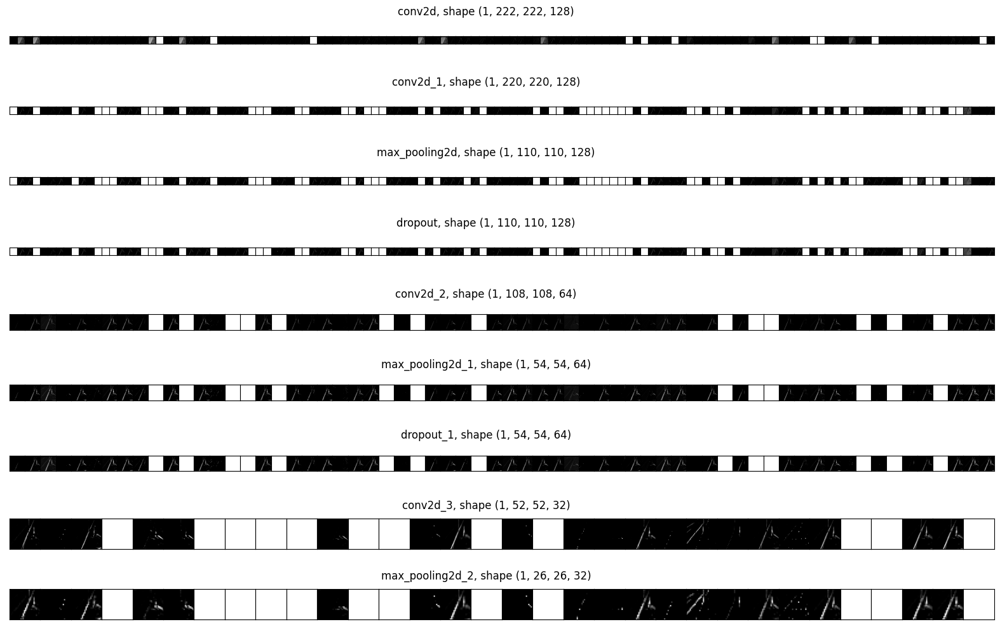

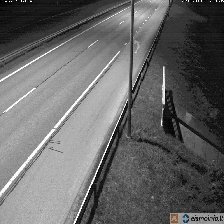

1/1 [==============================] - 0s 175ms/step


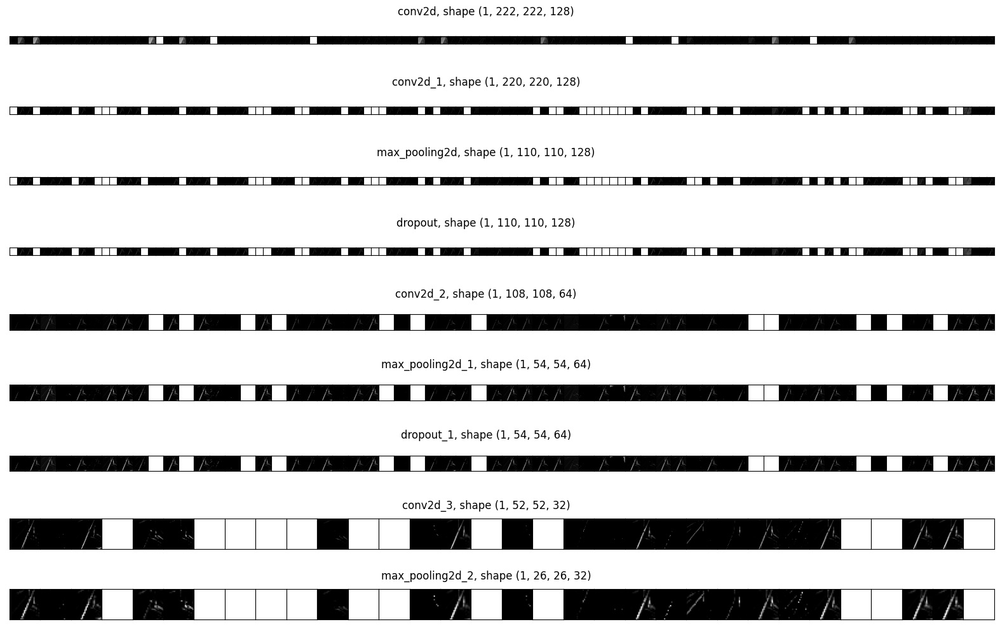

In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img


# img_path=test_dataset_path + '\\1\\364_2023-04-25_070624_183908987.jpg' #dog

def get_feature_map(img_path):
    successive_outputs = [layer.output for layer in model.layers]

    visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

    #Load the input image
    img = load_img(img_path, target_size=config.image_size)
    display(img)
    # Convert ht image to Array of dimension (150,150,3)
    x   = img_to_array(img) 
    x   = x.reshape((1,) + x.shape)
    # Rescale by 1/255
    x /= 255.0
    # Let's run input image through our vislauization network
    # to obtain all intermediate representations for the image.
    successive_feature_maps = visualization_model.predict(x)
    # Retrieve are the names of the layers, so can have them as part of our plot
    layer_names = [layer.name for layer in model.layers]

    counter = len([sfm for sfm in successive_feature_maps if len(sfm.shape)==4])
    max_n_features = max([sfm.shape[-1] for sfm in successive_feature_maps if len(sfm.shape)==4])

    fig = plt.figure(figsize=(20, 10))
    fig.subplots_adjust(wspace=0, hspace=0)
    fig.suptitle('Figure title')
    subfigs = fig.subfigures(nrows=counter, ncols=1)

    counter = 1

    for layer_name, feature_map in zip(layer_names, successive_feature_maps):

      if len(feature_map.shape) == 4:
        n_features = feature_map.shape[-1]  # number of features in the feature map
        for i in range(n_features):
          x  = feature_map[0, :, :, i]
          x -= x.mean()
          x /= x.std ()
          x *=  64
          x += 128
          x  = np.clip(x, 0, 255).astype('uint8')

        ix = 1

        ax = subfigs[counter-1].subplots(1, n_features)
        subfigs[counter-1].suptitle(layer_name + ", shape " + str(feature_map.shape))
        for _ in range(n_features):
            ax[ix-1].set_xticks([])
            ax[ix-1].set_yticks([])
            ax[ix-1].imshow(feature_map[0, :, :, ix-1], cmap='gray')
            ix += 1
        counter +=1
    img_name_for_feature_map = img_path.split('\\')[-1].split('.')[0]
    plt.savefig(path_for_outputs + '_feature_map.png')
    plt.show()
    wandb.log({ f'{img_name_for_feature_map}_Feature_Map' : fig })   

for img_path in  test_data.filepaths[5:7]:
    get_feature_map(img_path)
 
# test_data.file_paths

In [20]:
wandb.finish()

epoch/accuracy,▁▄▄▅▅▆▆▇██
epoch/auc,▁▅▆▆▆▇▇▇██
epoch/epoch,▁▂▃▃▄▅▆▆▇█
epoch/false_negatives,▆▂▅█▃▅▁▂▃▃
epoch/false_positives,█▇▄▂▅▂▅▃▂▁
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▄▄▃▃▃▃▂▁
epoch/precision,▁▃▄▇▄▆▅▆▇█
epoch/recall,▃▇▄▁▆▄█▇▆▆
epoch/true_negatives,▁▂▅▇▄▇▄▆▇█
epoch/true_positives,▃▇▄▁▆▄█▇▆▆
